# Notebook to analyze results - counterxamples



In [1]:
import pandas as pd
import os
import json
import numpy as np
import matplotlib.pyplot as plt

from mindreadingautobots.sequence_generators import make_datasets, data_io
from mindreadingautobots.entropy_and_bayesian import entropy
import time

import gspread
from google.oauth2.service_account import Credentials

from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap

from scipy.signal import savgol_filter

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


**Auxiliary functions**

In [2]:
def make_collection(x, y):
    
    # Create segments from the x and y points
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    # Create a custom colormap from dark purple (#4B0082) to yellow (#FFFF00)
    cmap = LinearSegmentedColormap.from_list("custom_cmap", ["#4B0082", "#FFFF00"])

    # Create a LineCollection with the segments and assign a gradient
    lc = LineCollection(segments, cmap=cmap, norm=plt.Normalize(0, 1))
    # Set an array for the colormap that goes from 0 (start) to 1 (end)
    lc.set_array(np.linspace(0, 1, len(segments)))
    lc.set_linewidth(1)

    return lc

def smooth(x, window=5, mode='same'):
    """Return the moving‐average of x with the given window size."""
    
    kernel = np.ones(window) / window
    return np.convolve(x, kernel, mode=mode)

def digits_to_tuple(s: str) -> tuple[int, ...]:
    """
    Convert a string of digits into a tuple of ints.
    
    Example:
      '000110000' → (0, 0, 0, 1, 1, 0, 0, 0, 0)
    """
    if not s.isdigit():
        raise ValueError("Input string must contain only digit characters.")
    return tuple(int(ch) for ch in s)



In [7]:
# Path to your service account JSON file
SERVICE_ACCOUNT_FILE = "../velvety-tube-450516-r5-2dfa430c056c.json" 


# Define the scope (Google Sheets + Google Drive API)
SCOPES = [
    "https://www.googleapis.com/auth/spreadsheets",
    "https://www.googleapis.com/auth/drive.file",  # Allows access to files the service account has access to
    "https://www.googleapis.com/auth/drive.readonly"  # Read-only access to drive files
]
# Authenticate with Google
creds = Credentials.from_service_account_file(SERVICE_ACCOUNT_FILE, scopes=SCOPES)
client = gspread.authorize(creds)

# Get names of all sheets
SPREADSHEET_NAME = "Matheus_counterexamples"

spreadsheet = client.open(SPREADSHEET_NAME)
sheet_names = [sheet.title for sheet in spreadsheet.worksheets() if "special" in sheet.title]
name_to_idx = {}
for i, name in enumerate(sheet_names):
    name_to_idx[name] = i
print("Sheets in the spreadsheet with 'special' in their name:")
for name in sheet_names:
    print(f"  {name}")

Sheets in the spreadsheet with 'special' in their name:
  RNN_counterexample000110000_nbits14_n10000_bf20_seed1234_special_model_4
  RNN_counterexample000110000_nbits14_n10000_bf20_seed1234_special_model_2
  RNN_counterexample000110000_nbits14_n10000_bf20_seed1234_special_model_3
  RNN_counterexample000110000_nbits14_n10000_bf20_seed1234_special_model_1
  RNN_counterexample000110000_nbits14_n10000_bf20_seed1234_special_model_0


## Analyzing multiple models for a potential counterexample

### Transformers

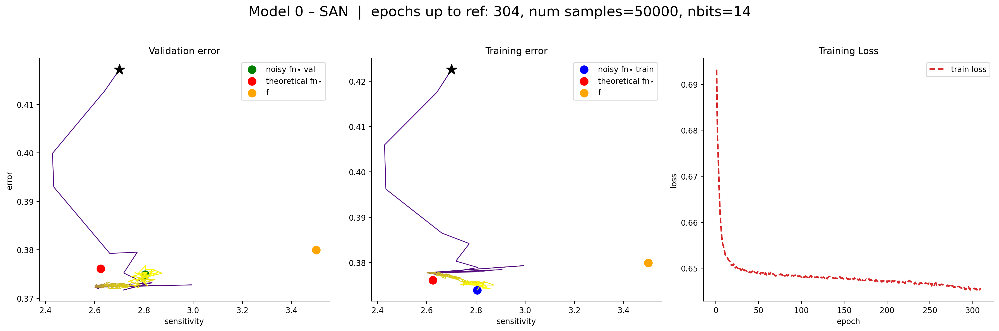

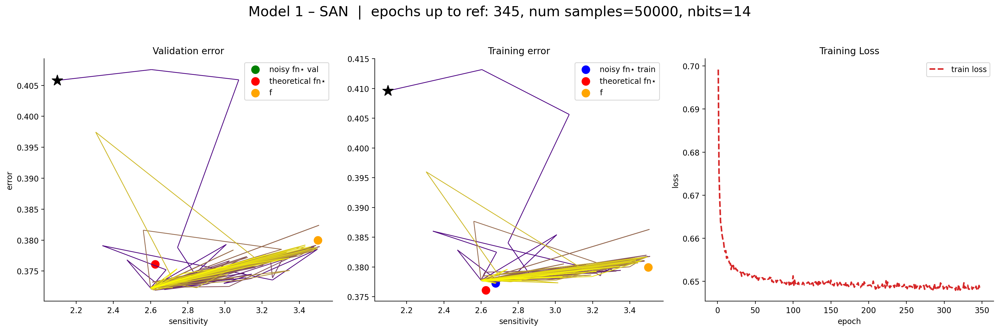

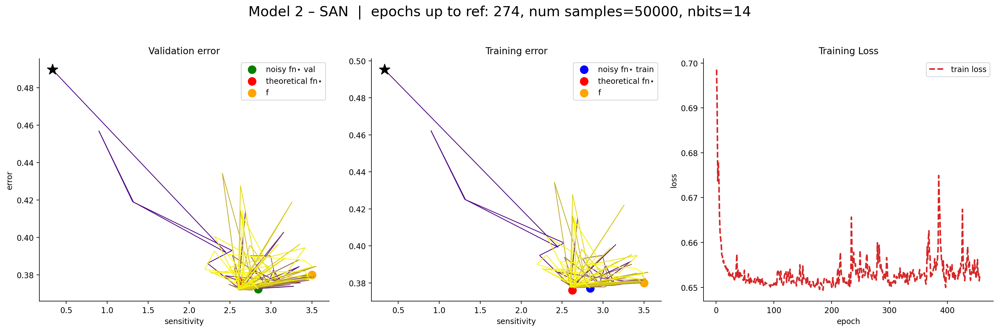

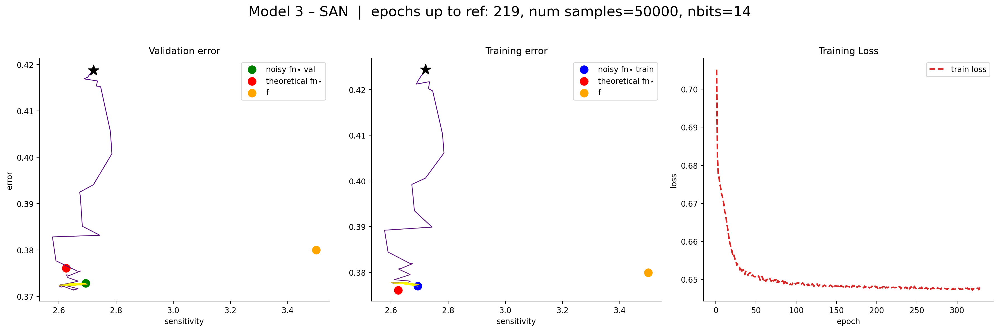

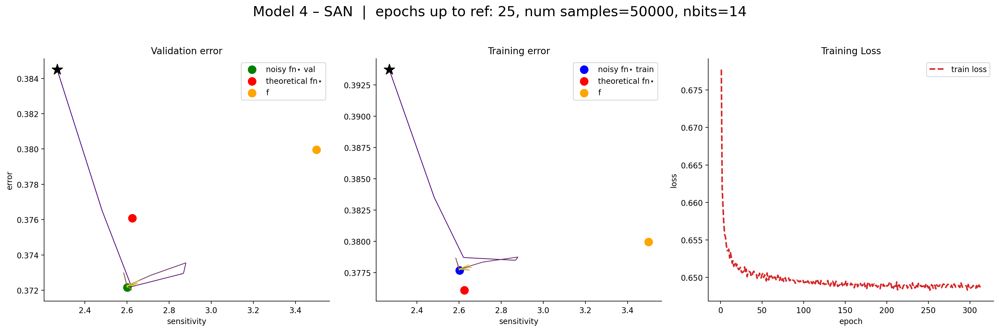

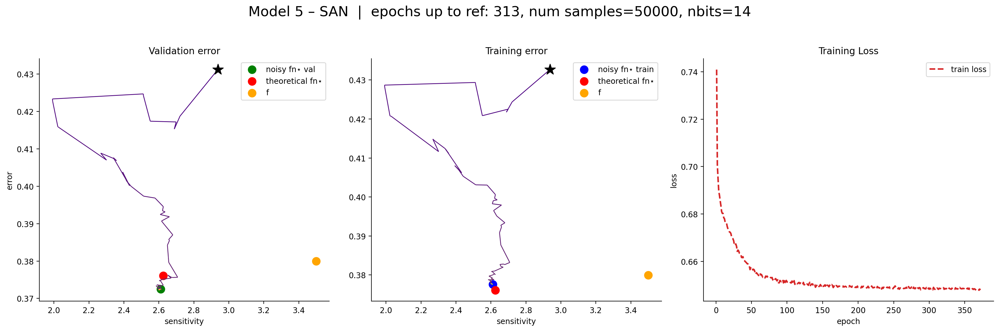

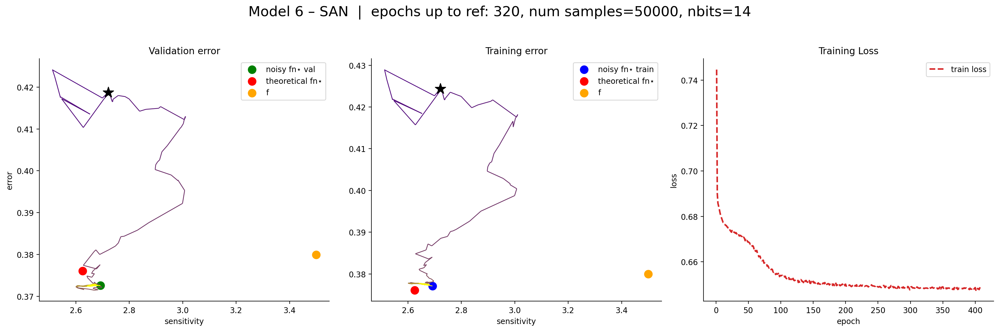

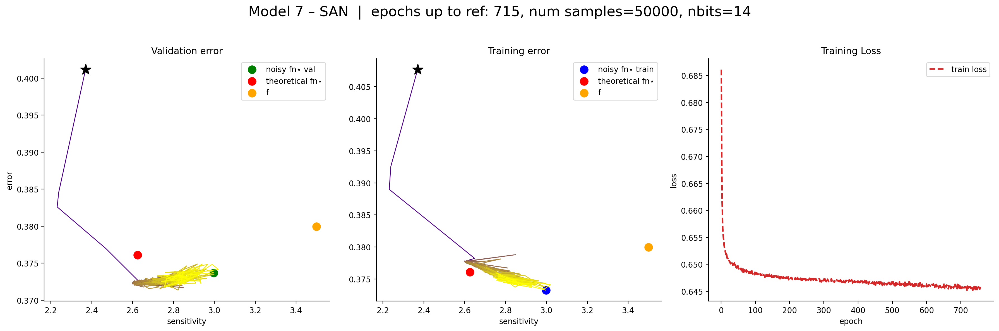

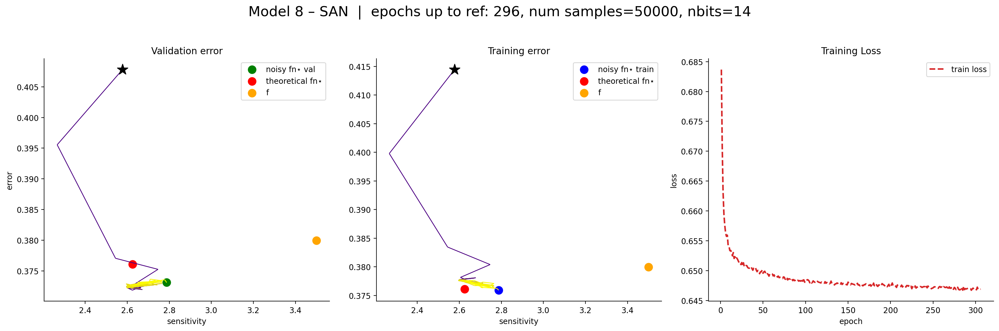

In [29]:
counterexample_signature = '000110000'
n = 8
num_samples = 50000
nbits = 14
model_type = "SAN"  # or "RNN"

# load theoretical info once
dentset_path = f"dentsets/weight_functions_n={n}_p=0.2.csv"
df_theoretical = pd.read_csv(dentset_path)
target_signature = str(digits_to_tuple(counterexample_signature))
theoretical_info = df_theoretical[df_theoretical["signature"] == target_signature]

model_range = range(0, 9)
steps_beyond_ref_index = 1

SMOOTH_CURVE = False
SHOW_ORIGINAL = True
smooth_window = 11
poly_order    = 3

for model in model_range:
    # ----- fetch data -----
    target_name = f"{model_type}_counterexample{counterexample_signature}_nbits{nbits}_n{num_samples}_bf20_seed1234_model_{model}"
    idx         = name_to_idx[target_name]
    ws          = spreadsheet.get_worksheet(idx)
    df_temp     = pd.DataFrame(ws.get_all_records())

    # find reference epoch
    #ref_idx = df_temp['val_acc'].idxmax()
    ref_idx = df_temp['train_acc'].idxmax()
    # prepare the three data series
    sens_line   = df_temp["sensitivity"].values[:ref_idx + steps_beyond_ref_index]
    val_line    = 1 - df_temp["val_acc"].values[:ref_idx + steps_beyond_ref_index]
    train_line  = 1 - df_temp["train_acc"].values[:ref_idx + steps_beyond_ref_index]
    epochs      = df_temp["epoch"].values

    # theoretical & star points
    fnstar_coords        = (theoretical_info["sensitivity_fnstar"].iloc[0],
                             1 - theoretical_info["fn_acc"].iloc[0])
    fnstar_theo_coords   = fnstar_coords
    f_coords             = (theoretical_info["sensitivity_f"].iloc[0],
                             1 - theoretical_info["f_acc"].iloc[0])
    fnstar_noisy_val     = (df_temp["sensitivity"].iloc[ref_idx],
                             1 - df_temp["val_acc"].iloc[ref_idx])
    fnstar_noisy_train   = (df_temp["sensitivity"].iloc[ref_idx],
                             1 - df_temp["train_acc"].iloc[ref_idx])

    # ----- set up figure -----
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"Model {model} – {model_type}  |  epochs up to ref: {len(sens_line)}, num samples={num_samples}, nbits={nbits}", fontsize=18)

    # --- (1) Validation error vs sensitivity ---
    ax = axes[0]
    if SHOW_ORIGINAL:
        ax.add_collection(make_collection(sens_line, val_line))
        ax.autoscale()
        ax.scatter(*sens_line[:1], *val_line[:1], marker='*', s=200, color='black', zorder=5)
    ax.scatter(*fnstar_noisy_val,   color="green",  label="noisy fn⋆ val",   s=100)
    ax.scatter(*fnstar_theo_coords, color="red",    label="theoretical fn⋆", s=100)
    ax.scatter(*f_coords,           color="orange", label="f",              s=100)
    ax.set_title("Validation error")
    ax.set_xlabel("sensitivity")
    ax.set_ylabel("error")
    ax.legend(loc="upper right")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- (2) Training error vs sensitivity ---
    ax = axes[1]
    if SHOW_ORIGINAL:
        ax.add_collection(make_collection(sens_line, train_line))
        ax.autoscale()
        ax.scatter(*sens_line[:1], *train_line[:1], marker='*', s=200, color='black', zorder=5)
    ax.scatter(*fnstar_noisy_train, color="blue",   label="noisy fn⋆ train", s=100)
    ax.scatter(*fnstar_theo_coords, color="red",    label="theoretical fn⋆", s=100)
    ax.scatter(*f_coords,           color="orange", label="f",              s=100)
    ax.set_title("Training error")
    ax.set_xlabel("sensitivity")
    # share y-axis with first plot
    
    ax.legend(loc="upper right")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- (3) Training loss vs epoch ---
    ax = axes[2]
    ax.plot(epochs, df_temp['train_loss'], ls='--', lw=2, color='tab:red', label='train loss')
    ax.set_title("Training Loss")
    ax.set_xlabel("epoch")
    ax.set_ylabel("loss")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


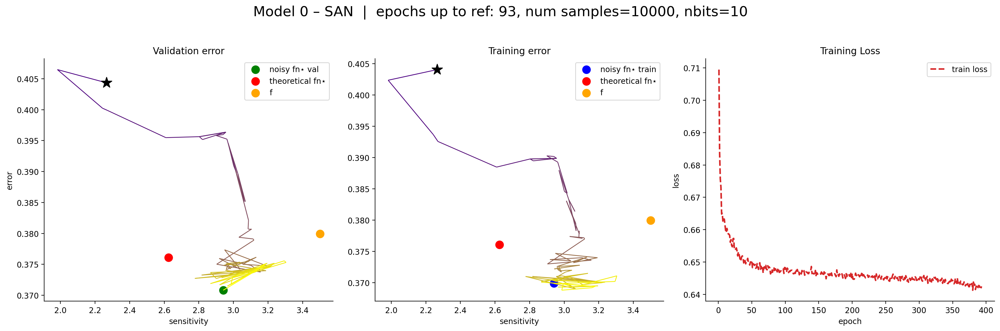

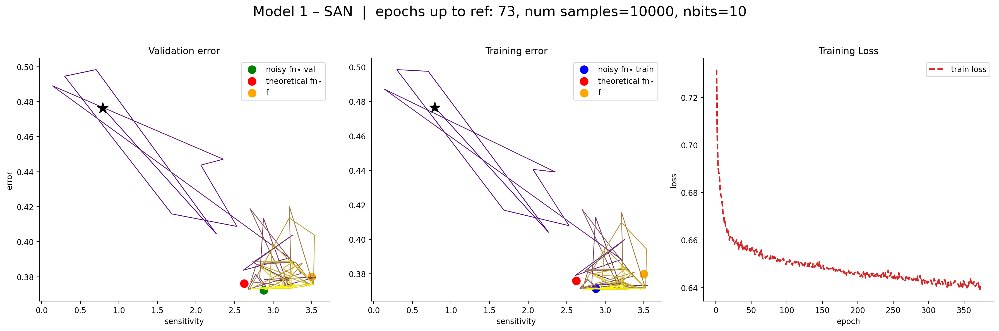

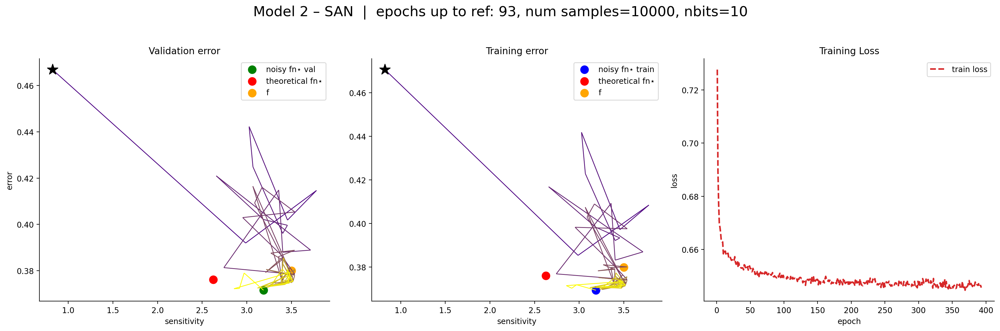

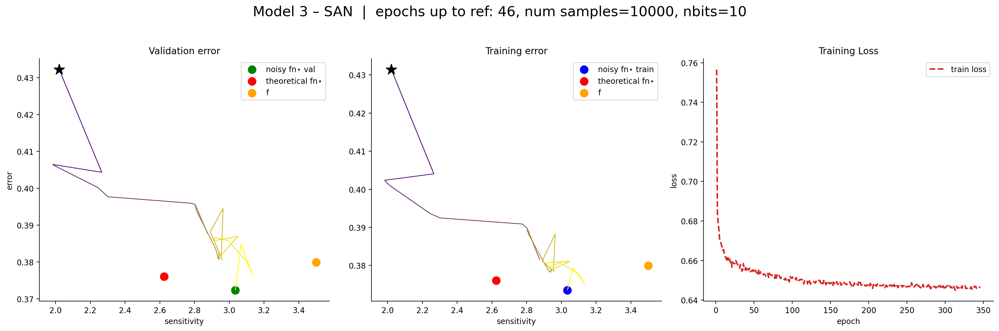

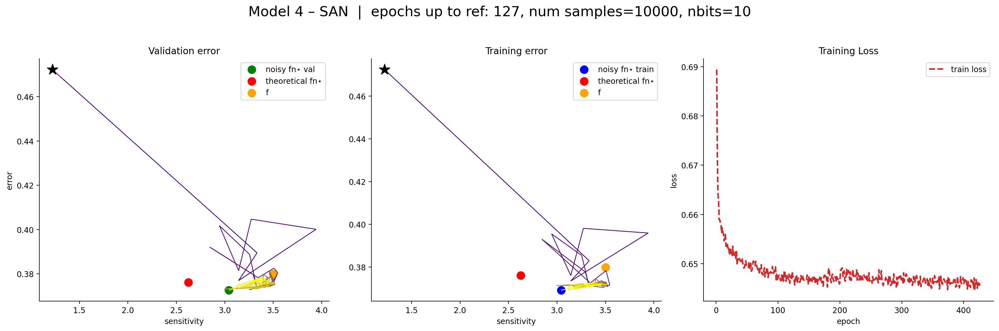

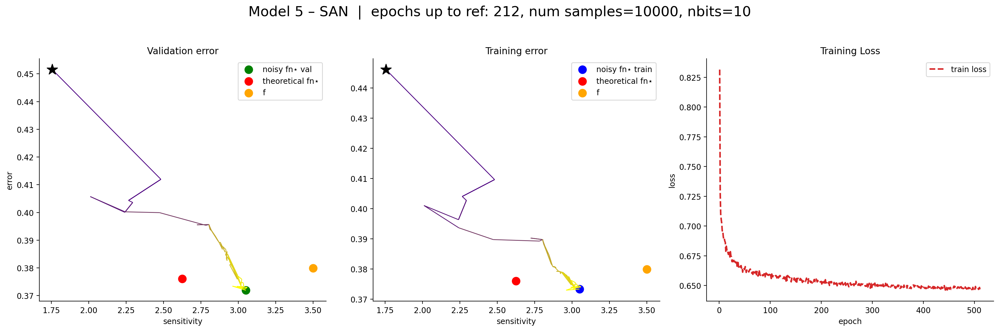

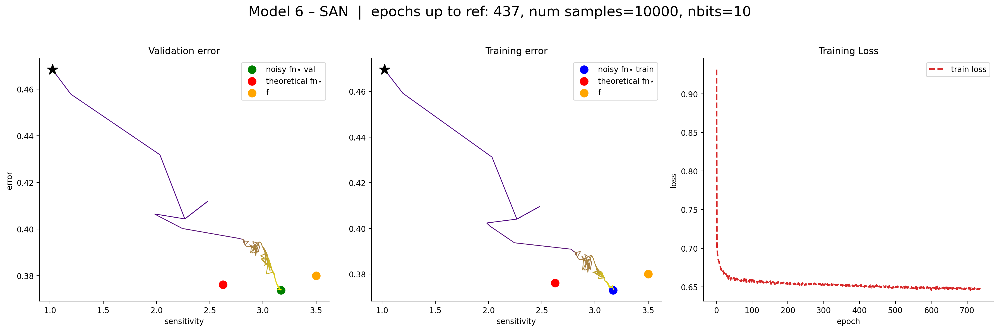

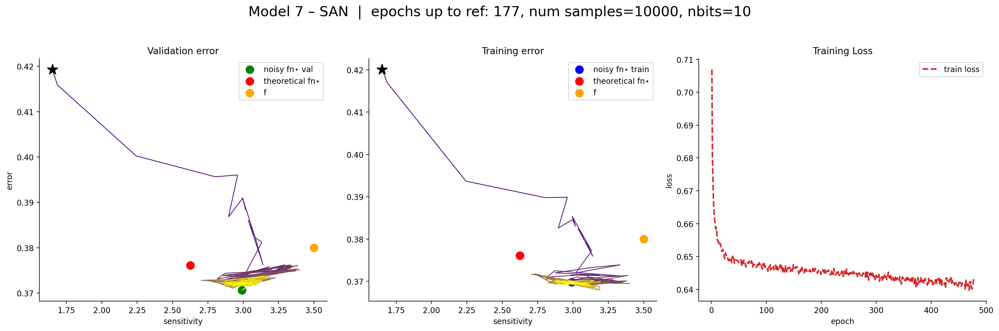

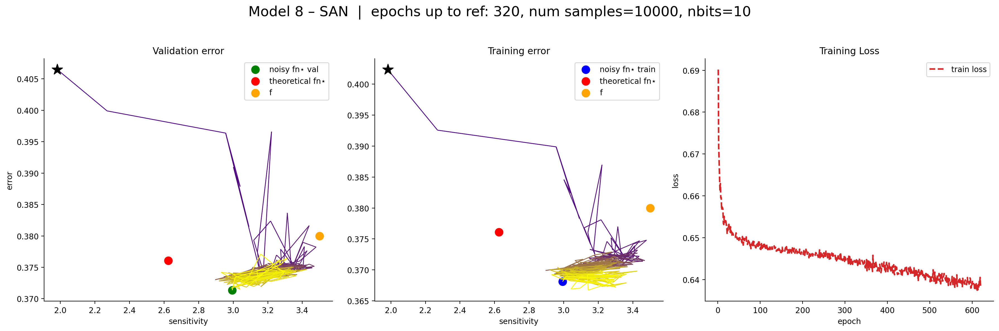

In [17]:
counterexample_signature = '000110000'
n = 8
num_samples = 10000
nbits = 10
model_type = "SAN"  # or "RNN"

# load theoretical info once
dentset_path = f"dentsets/weight_functions_n={n}_p=0.2.csv"
df_theoretical = pd.read_csv(dentset_path)
target_signature = str(digits_to_tuple(counterexample_signature))
theoretical_info = df_theoretical[df_theoretical["signature"] == target_signature]

model_range = range(0, 9)
steps_beyond_ref_index = 1

SMOOTH_CURVE = False
SHOW_ORIGINAL = True
smooth_window = 11
poly_order    = 3

for model in model_range:
    # ----- fetch data -----
    target_name = f"{model_type}_counterexample{counterexample_signature}_nbits{nbits}_n{num_samples}_bf20_seed1234_model_{model}"
    idx         = name_to_idx[target_name]
    ws          = spreadsheet.get_worksheet(idx)
    df_temp     = pd.DataFrame(ws.get_all_records())

    # find reference epoch
    ref_idx = df_temp['val_acc'].idxmax()
    # prepare the three data series
    sens_line   = df_temp["sensitivity"].values[:ref_idx + steps_beyond_ref_index]
    val_line    = 1 - df_temp["val_acc"].values[:ref_idx + steps_beyond_ref_index]
    train_line  = 1 - df_temp["train_acc"].values[:ref_idx + steps_beyond_ref_index]
    epochs      = df_temp["epoch"].values

    # theoretical & star points
    fnstar_coords        = (theoretical_info["sensitivity_fnstar"].iloc[0],
                             1 - theoretical_info["fn_acc"].iloc[0])
    fnstar_theo_coords   = fnstar_coords
    f_coords             = (theoretical_info["sensitivity_f"].iloc[0],
                             1 - theoretical_info["f_acc"].iloc[0])
    fnstar_noisy_val     = (df_temp["sensitivity"].iloc[ref_idx],
                             1 - df_temp["val_acc"].iloc[ref_idx])
    fnstar_noisy_train   = (df_temp["sensitivity"].iloc[ref_idx],
                             1 - df_temp["train_acc"].iloc[ref_idx])

    # ----- set up figure -----
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"Model {model} – {model_type}  |  epochs up to ref: {len(sens_line)}, num samples={num_samples}, nbits={nbits}", fontsize=18)

    # --- (1) Validation error vs sensitivity ---
    ax = axes[0]
    if SHOW_ORIGINAL:
        ax.add_collection(make_collection(sens_line, val_line))
        ax.autoscale()
        ax.scatter(*sens_line[:1], *val_line[:1], marker='*', s=200, color='black', zorder=5)
    ax.scatter(*fnstar_noisy_val,   color="green",  label="noisy fn⋆ val",   s=100)
    ax.scatter(*fnstar_theo_coords, color="red",    label="theoretical fn⋆", s=100)
    ax.scatter(*f_coords,           color="orange", label="f",              s=100)
    ax.set_title("Validation error")
    ax.set_xlabel("sensitivity")
    ax.set_ylabel("error")
    ax.legend(loc="upper right")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- (2) Training error vs sensitivity ---
    ax = axes[1]
    if SHOW_ORIGINAL:
        ax.add_collection(make_collection(sens_line, train_line))
        ax.autoscale()
        ax.scatter(*sens_line[:1], *train_line[:1], marker='*', s=200, color='black', zorder=5)
    ax.scatter(*fnstar_noisy_train, color="blue",   label="noisy fn⋆ train", s=100)
    ax.scatter(*fnstar_theo_coords, color="red",    label="theoretical fn⋆", s=100)
    ax.scatter(*f_coords,           color="orange", label="f",              s=100)
    ax.set_title("Training error")
    ax.set_xlabel("sensitivity")
    # share y-axis with first plot
    
    ax.legend(loc="upper right")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- (3) Training loss vs epoch ---
    ax = axes[2]
    ax.plot(epochs, df_temp['train_loss'], ls='--', lw=2, color='tab:red', label='train loss')
    ax.set_title("Training Loss")
    ax.set_xlabel("epoch")
    ax.set_ylabel("loss")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


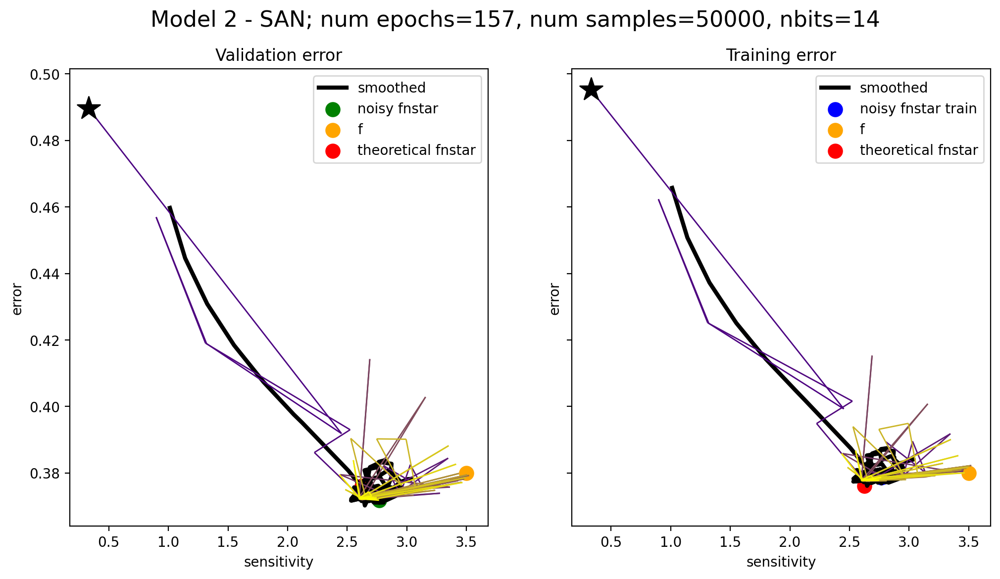

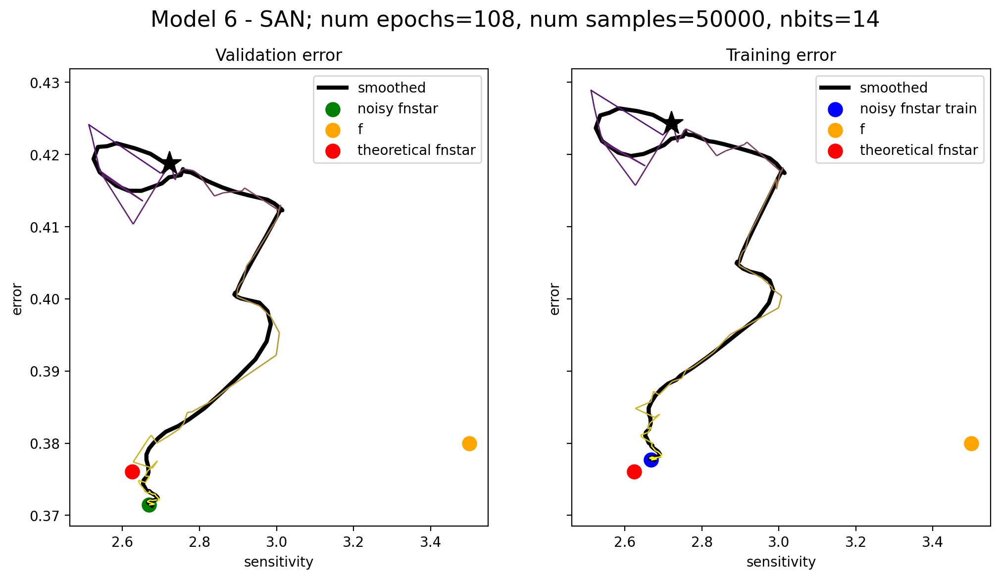

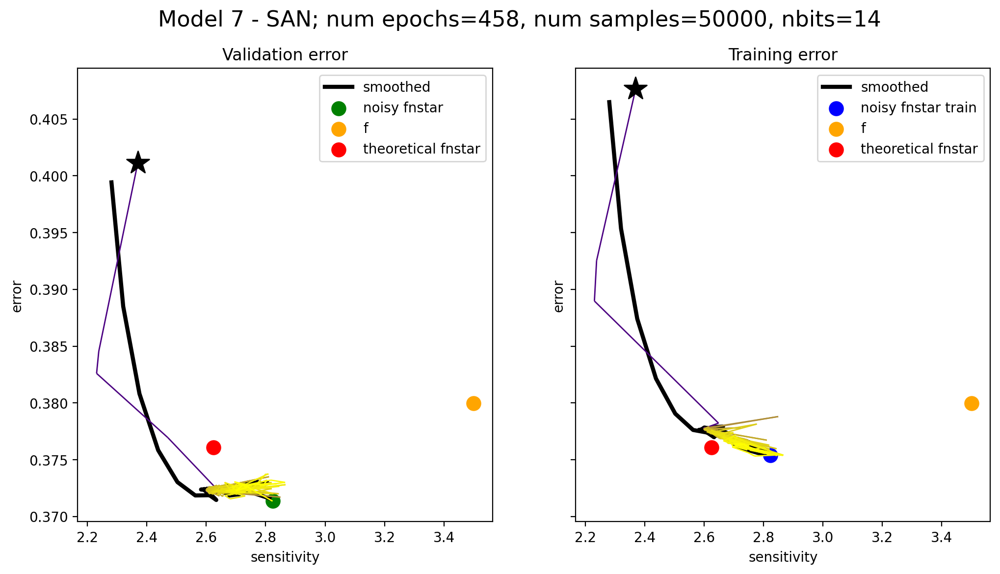

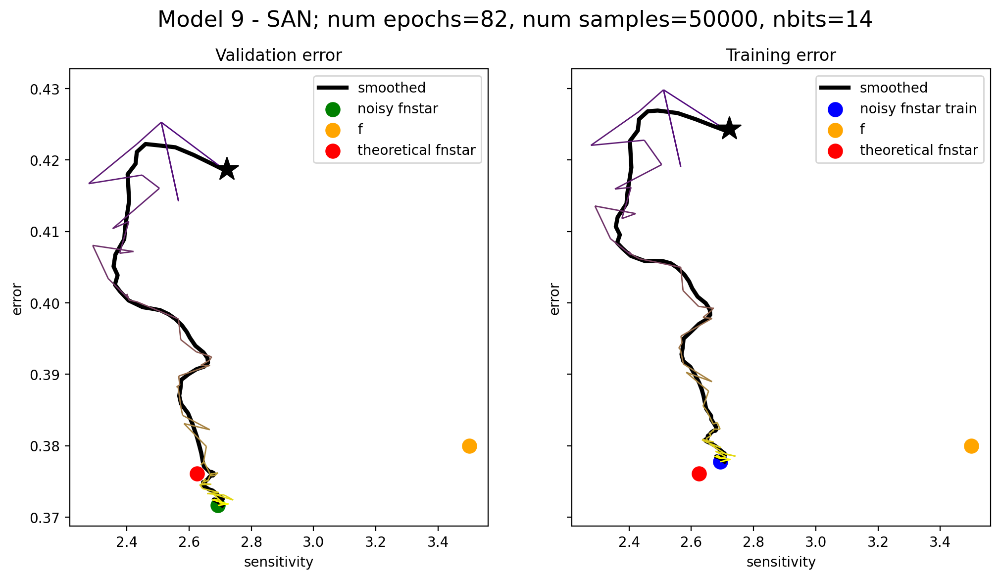

In [9]:
counterexample_signature = '000110000'
n = 8

dentset_path = f"dentsets/weight_functions_n={n}_p=0.2.csv"
df_theoretical = pd.read_csv(dentset_path)
target_signature = str(digits_to_tuple(counterexample_signature))
theoretical_info = df_theoretical[df_theoretical["signature"] == target_signature]
model_type = "SAN" # SAN or RNN
num_samples = 50000
nbits = 14
model_list = [2, 6, 7, 9]
steps_beyond_ref_index = 1


SMOOTH_CURVE = True
SHOW_ORIGINAL = True
smooth_window = 11
poly_order    = 3

for model in model_list:
    
    target_temp = f"{model_type}_counterexample{counterexample_signature}_nbits{nbits}_n{num_samples}_bf20_seed1234_model_{model}"
    target_idx_temp = name_to_idx.get(target_temp)
    sheet_temp = spreadsheet.get_worksheet(target_idx_temp)
    data_temp = sheet_temp.get_all_records()
    df_temp = pd.DataFrame(data_temp)

    ref_idx = df_temp['val_acc'].idxmax()

    fnstar_coords_temp = np.array((df_temp["sensitivity"][ref_idx],  1 - df_temp['val_acc'][ref_idx]))
    fnstar_train_coords_temp = np.array((df_temp["sensitivity"][ref_idx],  1 - df_temp['train_acc'][ref_idx]))
    fnstar_theo_coords_temp = np.array((theoretical_info["sensitivity_fnstar"].values[0], 1 - theoretical_info['fn_acc'].values[0]))
    f_coords_temp = np.array((theoretical_info["sensitivity_f"].values[0], 1 - theoretical_info['f_acc'].values[0]))


    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

    try:
        sens_line = df_temp["sensitivity"].values[:ref_idx + steps_beyond_ref_index]
    except KeyError:
        sens_line = df_temp["sensitivity"].values

    try:
        val_line = 1 - df_temp["val_acc"].values[:ref_idx + steps_beyond_ref_index]
    except KeyError:
        val_line = 1 - df_temp["val_acc"].values

    try:
        train_line = 1 - df_temp["train_acc"].values[:ref_idx + steps_beyond_ref_index]
    except KeyError:
        train_line = 1 - df_temp["train_acc"].values


    num_epochs = len(sens_line)
  
    fig.suptitle(f"Model {model} - {model_type}; num epochs={num_epochs}, num samples={num_samples}, nbits={nbits}", fontsize=16)


    if SMOOTH_CURVE and num_epochs > 50:

        # smooth the curves
        val_smooth   = savgol_filter(val_line,   window_length=smooth_window, polyorder=poly_order)
        train_smooth = savgol_filter(train_line, window_length=smooth_window, polyorder=poly_order)
        sens_smooth  = savgol_filter(sens_line,  window_length=smooth_window, polyorder=poly_order)

        # build collections from the smoothed data
        # lc_val   = make_collection(sens_smooth,  val_smooth)
        # lc_train = make_collection(sens_smooth,  train_smooth)

        # plot smoothed curves
        axes[0].plot(sens_smooth,  val_smooth,   lw=3.0, color='black',  label='smoothed')
        axes[1].plot(sens_smooth,  train_smooth, lw=3.0, color='black', label='smoothed')
    
        

    if SHOW_ORIGINAL: 

        axes[0].add_collection(make_collection(sens_line, val_line))
        axes[1].add_collection(make_collection(sens_line, train_line))
        axes[0].autoscale()
        axes[1].autoscale()


        axes[0].scatter(sens_line[0], val_line[0], marker='*', s=300, color='black', zorder=5)
        axes[1].scatter(sens_line[0], train_line[0], marker='*', s=300, color='black', zorder=5)


    for i, ax in enumerate(axes):

        if i == 0:
            ax.scatter(*(fnstar_coords_temp.T), color="green", label="noisy fnstar", s=100)
        else:
            ax.scatter(*(fnstar_train_coords_temp.T), color="blue", label="noisy fnstar train", s=100)

        ax.scatter(*(f_coords_temp.T), color="orange", label="f", s=100)
        ax.scatter(*(fnstar_theo_coords_temp.T), color="red", label="theoretical fnstar", s=100)
        # ax.plot(sensitivity_history, error_history, color="purple", label="transformer")
        ax.set_ylabel("error")
        ax.set_xlabel("sensitivity")
        # ax.set_xlim(1, 3)
        # ax.set_ylim(0, 0.6)
        ax.legend(loc="upper right")

    axes[0].set_title("Validation error")
    axes[1].set_title("Training error");



### RNNs

**For some reason, RNNs are particularly bad with the data we have been working with. I would say we ignore them, and focus on the Transformer.**

#### New models

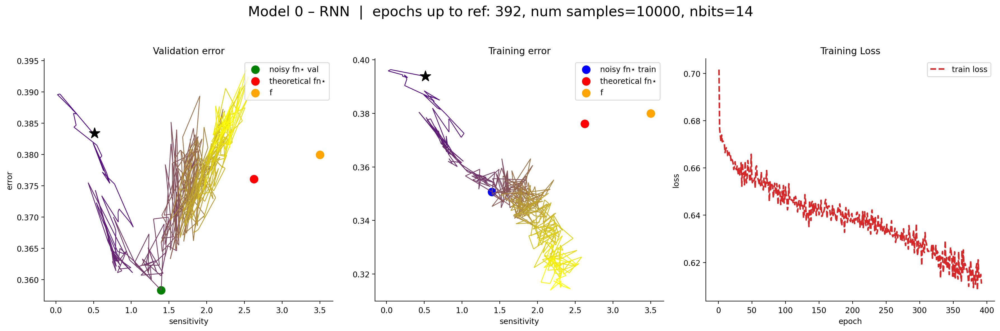

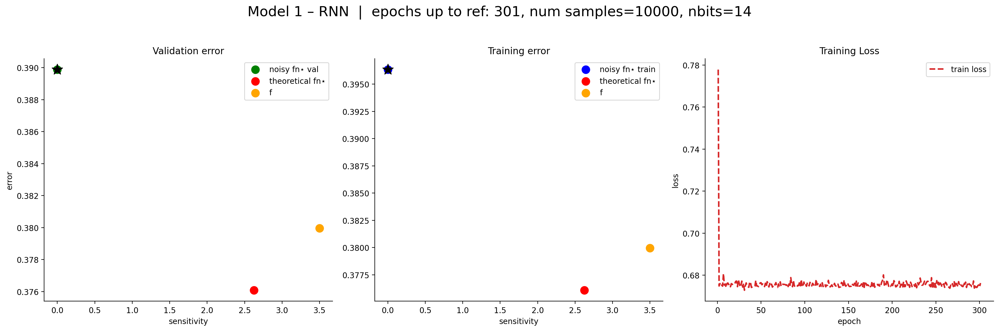

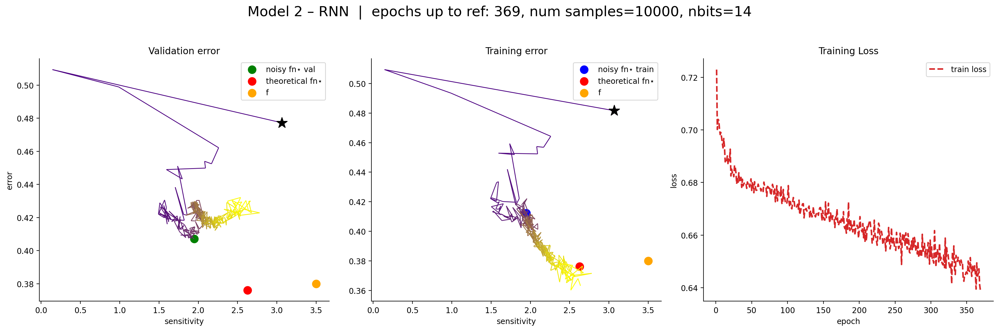

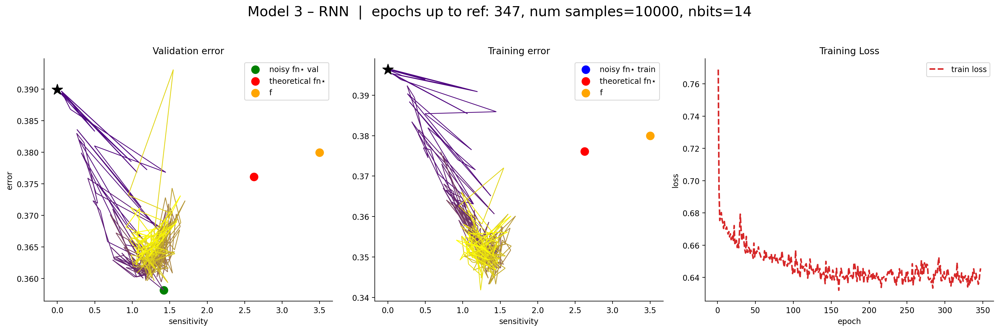

In [8]:
####### GENERATE NEW CODE TO ANALYZE THE FIVE NEW MODELS #######


counterexample_signature = '000110000'
n = 8
num_samples = 10000
nbits = 14
model_type = "RNN"  # or "RNN"

# load theoretical info once
dentset_path = f"dentsets/weight_functions_n={n}_p=0.2.csv"
df_theoretical = pd.read_csv(dentset_path)
target_signature = str(digits_to_tuple(counterexample_signature))
theoretical_info = df_theoretical[df_theoretical["signature"] == target_signature]

model_range = range(0, 5)
steps_beyond_ref_index = 1

SMOOTH_CURVE = False
SHOW_ORIGINAL = True
smooth_window = 11
poly_order    = 3

for model in model_range:
    # ----- fetch data -----
    target_name = f"{model_type}_counterexample{counterexample_signature}_nbits{nbits}_n{num_samples}_bf20_seed1234_special_model_{model}"
    idx         = name_to_idx[target_name]
    ws          = spreadsheet.get_worksheet(idx)
    df_temp     = pd.DataFrame(ws.get_all_records())

    # find reference epoch
    ref_idx = df_temp['val_acc'].idxmax()
    sens_line   = df_temp["sensitivity"].values
    val_line    = 1 - df_temp["val_acc"].values
    train_line  = 1 - df_temp["train_acc"].values
    
    epochs      = df_temp["epoch"].values

    # theoretical & star points
    fnstar_coords        = (theoretical_info["sensitivity_fnstar"].iloc[0],
                             1 - theoretical_info["fn_acc"].iloc[0])
    fnstar_theo_coords   = fnstar_coords
    f_coords             = (theoretical_info["sensitivity_f"].iloc[0],
                             1 - theoretical_info["f_acc"].iloc[0])
    fnstar_noisy_val     = (df_temp["sensitivity"].iloc[ref_idx],
                             1 - df_temp["val_acc"].iloc[ref_idx])
    fnstar_noisy_train   = (df_temp["sensitivity"].iloc[ref_idx],
                             1 - df_temp["train_acc"].iloc[ref_idx])

    # ----- set up figure -----
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"Model {model} – {model_type}  |  epochs up to ref: {len(sens_line)}, num samples={num_samples}, nbits={nbits}", fontsize=18)

    # --- (1) Validation error vs sensitivity ---
    ax = axes[0]
    if SHOW_ORIGINAL:
        ax.add_collection(make_collection(sens_line, val_line))
        ax.autoscale()
        ax.scatter(*sens_line[:1], *val_line[:1], marker='*', s=200, color='black', zorder=5)
    ax.scatter(*fnstar_noisy_val,   color="green",  label="noisy fn⋆ val",   s=100)
    ax.scatter(*fnstar_theo_coords, color="red",    label="theoretical fn⋆", s=100)
    ax.scatter(*f_coords,           color="orange", label="f",              s=100)
    ax.set_title("Validation error")
    ax.set_xlabel("sensitivity")
    ax.set_ylabel("error")
    ax.legend(loc="upper right")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- (2) Training error vs sensitivity ---
    ax = axes[1]
    if SHOW_ORIGINAL:
        ax.add_collection(make_collection(sens_line, train_line))
        ax.autoscale()
        ax.scatter(*sens_line[:1], *train_line[:1], marker='*', s=200, color='black', zorder=5)
    ax.scatter(*fnstar_noisy_train, color="blue",   label="noisy fn⋆ train", s=100)
    ax.scatter(*fnstar_theo_coords, color="red",    label="theoretical fn⋆", s=100)
    ax.scatter(*f_coords,           color="orange", label="f",              s=100)
    ax.set_title("Training error")
    ax.set_xlabel("sensitivity")
    # share y-axis with first plot
    
    ax.legend(loc="upper right")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- (3) Training loss vs epoch ---
    ax = axes[2]
    ax.plot(epochs, df_temp['train_loss'], ls='--', lw=2, color='tab:red', label='train loss')
    ax.set_title("Training Loss")
    ax.set_xlabel("epoch")
    ax.set_ylabel("loss")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


#### Old models - mostly useless

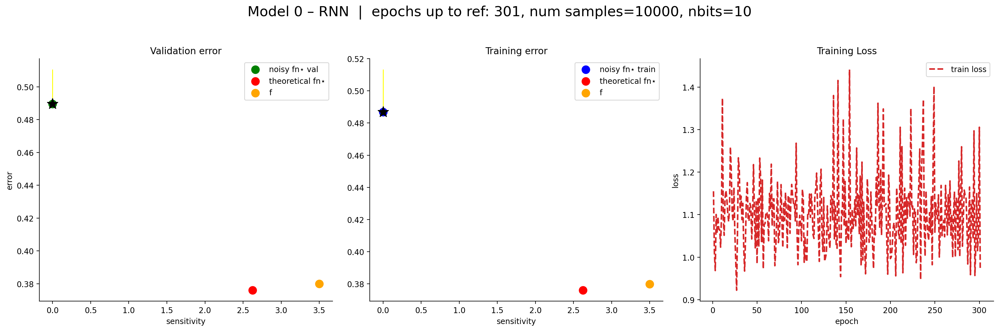

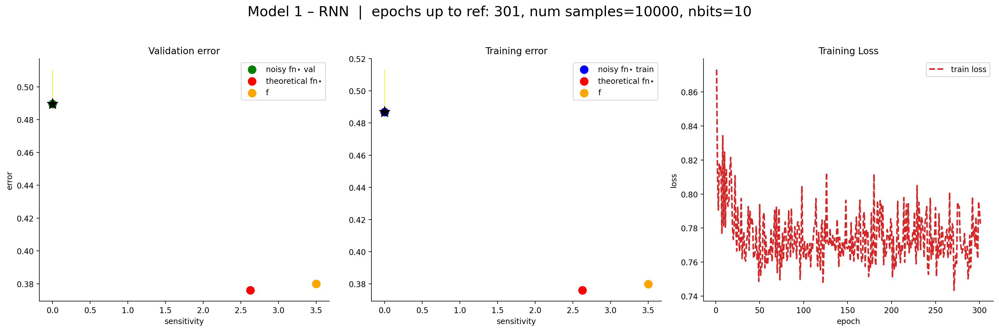

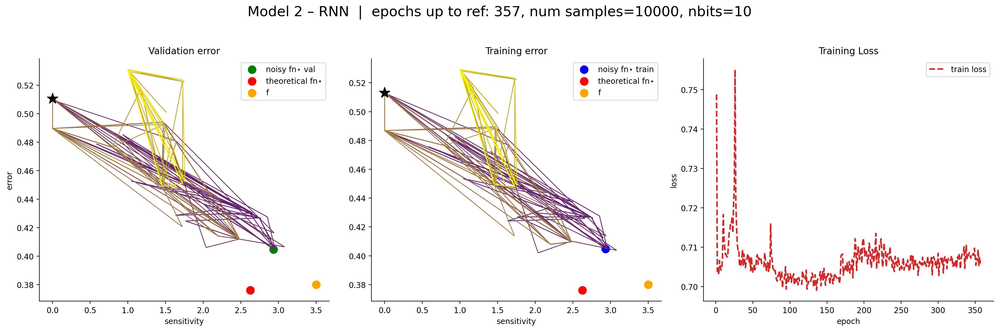

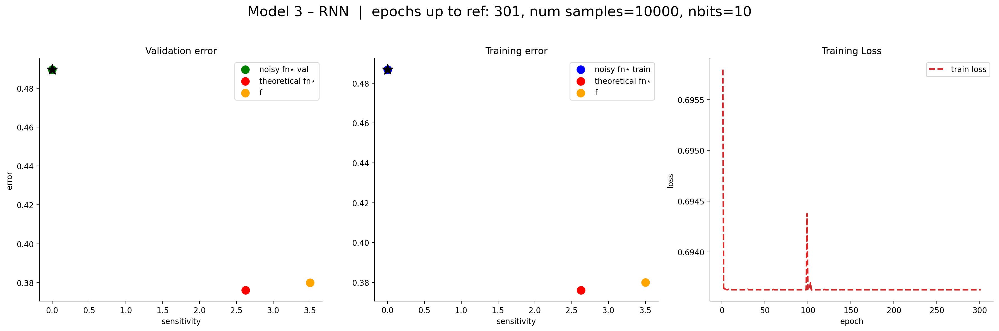

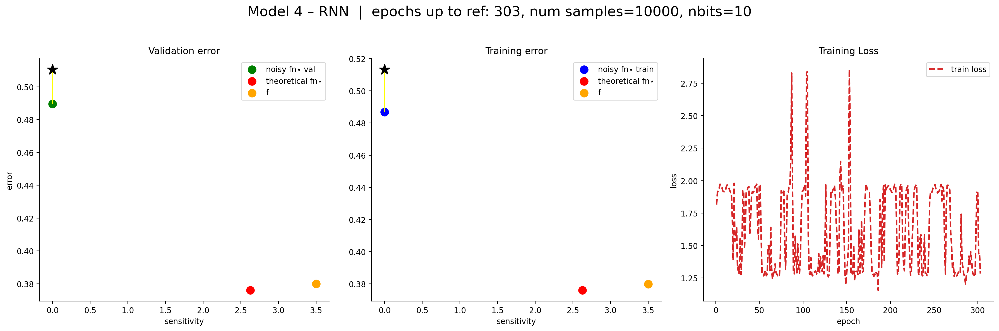

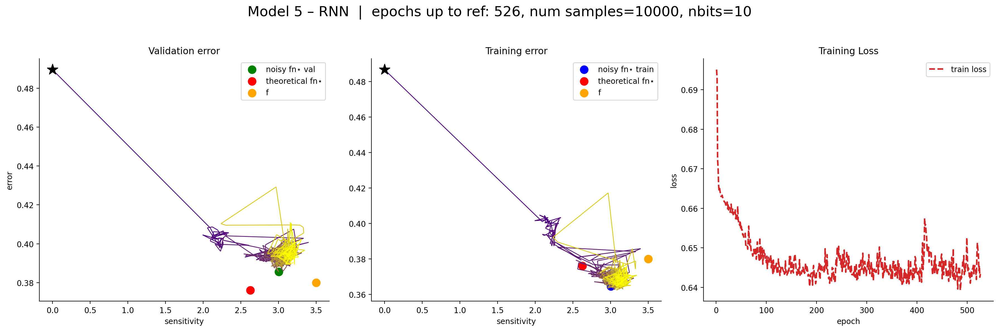

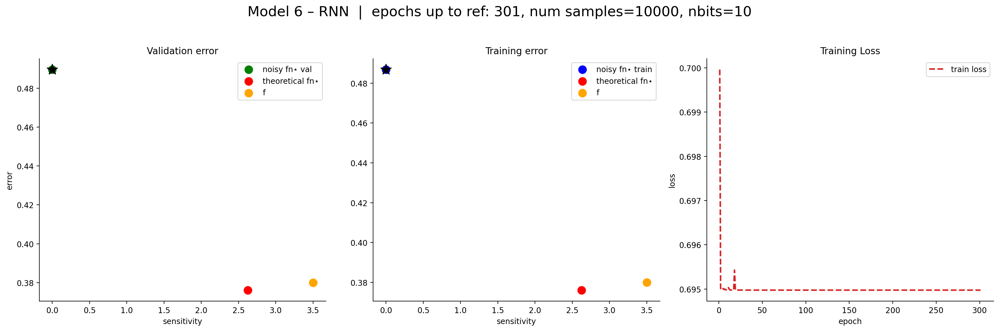

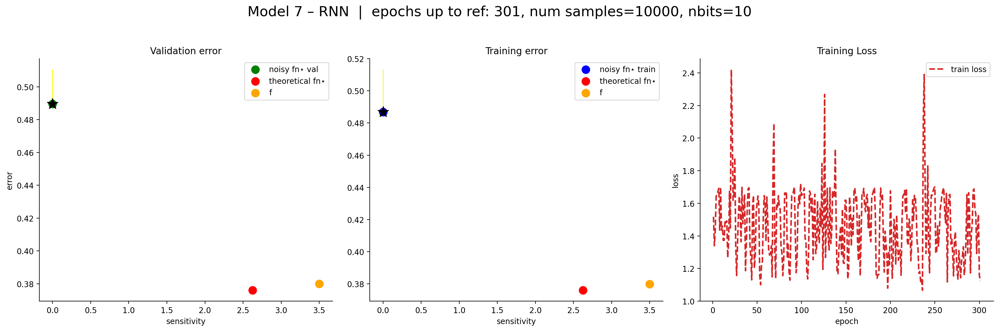

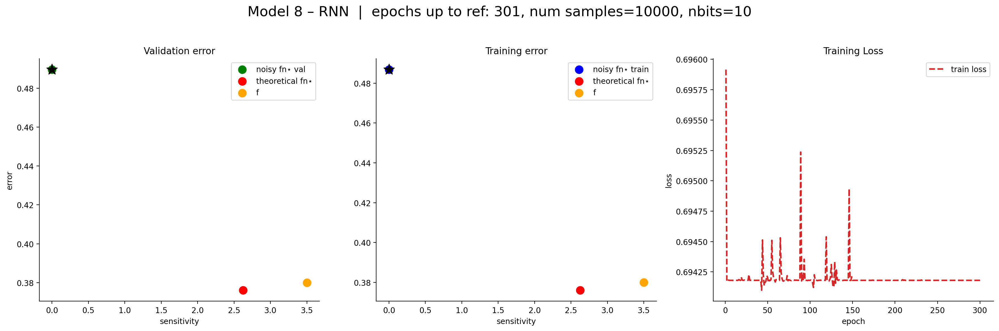

In [26]:
counterexample_signature = '000110000'
n = 8
num_samples = 10000
nbits = 10
model_type = "RNN"  # or "RNN"

# load theoretical info once
dentset_path = f"dentsets/weight_functions_n={n}_p=0.2.csv"
df_theoretical = pd.read_csv(dentset_path)
target_signature = str(digits_to_tuple(counterexample_signature))
theoretical_info = df_theoretical[df_theoretical["signature"] == target_signature]

model_range = range(0, 9)
steps_beyond_ref_index = 1000

SMOOTH_CURVE = False
SHOW_ORIGINAL = True
smooth_window = 11
poly_order    = 3

for model in model_range:
    # ----- fetch data -----
    target_name = f"{model_type}_counterexample{counterexample_signature}_nbits{nbits}_n{num_samples}_bf20_seed1234_model_{model}"
    idx         = name_to_idx[target_name]
    ws          = spreadsheet.get_worksheet(idx)
    df_temp     = pd.DataFrame(ws.get_all_records())

    # find reference epoch
    ref_idx = df_temp['val_acc'].idxmax()
    # prepare the three data series
    # sens_line   = df_temp["sensitivity"].values[:ref_idx + steps_beyond_ref_index]
    # val_line    = 1 - df_temp["val_acc"].values[:ref_idx + steps_beyond_ref_index]
    # train_line  = 1 - df_temp["train_acc"].values[:ref_idx + steps_beyond_ref_index]
    sens_line   = df_temp["sensitivity"].values
    val_line    = 1 - df_temp["val_acc"].values
    train_line  = 1 - df_temp["train_acc"].values
    
    epochs      = df_temp["epoch"].values

    # theoretical & star points
    fnstar_coords        = (theoretical_info["sensitivity_fnstar"].iloc[0],
                             1 - theoretical_info["fn_acc"].iloc[0])
    fnstar_theo_coords   = fnstar_coords
    f_coords             = (theoretical_info["sensitivity_f"].iloc[0],
                             1 - theoretical_info["f_acc"].iloc[0])
    fnstar_noisy_val     = (df_temp["sensitivity"].iloc[ref_idx],
                             1 - df_temp["val_acc"].iloc[ref_idx])
    fnstar_noisy_train   = (df_temp["sensitivity"].iloc[ref_idx],
                             1 - df_temp["train_acc"].iloc[ref_idx])

    # ----- set up figure -----
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"Model {model} – {model_type}  |  epochs up to ref: {len(sens_line)}, num samples={num_samples}, nbits={nbits}", fontsize=18)

    # --- (1) Validation error vs sensitivity ---
    ax = axes[0]
    if SHOW_ORIGINAL:
        ax.add_collection(make_collection(sens_line, val_line))
        ax.autoscale()
        ax.scatter(*sens_line[:1], *val_line[:1], marker='*', s=200, color='black', zorder=5)
    ax.scatter(*fnstar_noisy_val,   color="green",  label="noisy fn⋆ val",   s=100)
    ax.scatter(*fnstar_theo_coords, color="red",    label="theoretical fn⋆", s=100)
    ax.scatter(*f_coords,           color="orange", label="f",              s=100)
    ax.set_title("Validation error")
    ax.set_xlabel("sensitivity")
    ax.set_ylabel("error")
    ax.legend(loc="upper right")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- (2) Training error vs sensitivity ---
    ax = axes[1]
    if SHOW_ORIGINAL:
        ax.add_collection(make_collection(sens_line, train_line))
        ax.autoscale()
        ax.scatter(*sens_line[:1], *train_line[:1], marker='*', s=200, color='black', zorder=5)
    ax.scatter(*fnstar_noisy_train, color="blue",   label="noisy fn⋆ train", s=100)
    ax.scatter(*fnstar_theo_coords, color="red",    label="theoretical fn⋆", s=100)
    ax.scatter(*f_coords,           color="orange", label="f",              s=100)
    ax.set_title("Training error")
    ax.set_xlabel("sensitivity")
    # share y-axis with first plot
    
    ax.legend(loc="upper right")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- (3) Training loss vs epoch ---
    ax = axes[2]
    ax.plot(epochs, df_temp['train_loss'], ls='--', lw=2, color='tab:red', label='train loss')
    ax.set_title("Training Loss")
    ax.set_xlabel("epoch")
    ax.set_ylabel("loss")
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [35]:
# target_name = f"{model_type}_counterexample{counterexample_signature}_nbits{nbits}_n{num_samples}_bf20_seed1234_model_6"
# idx         = name_to_idx[target_name]
# ws          = spreadsheet.get_worksheet(idx)
# df_temp     = pd.DataFrame(ws.get_all_records())
# df_temp.head(20)

In [25]:
counterexample_signature = '000110000'
nbits = 10
num_samples = 10000
base_dir = os.path.abspath(os.path.join(os.getcwd(), "../../tune_results"))
target_base = f"RNN_counterexample{counterexample_signature}_nbits{nbits}_n{num_samples}_bf20_seed1234"
run = 'run_2025-05-02-13-05-34-684934'
model_list = range(0, 9)
for model_number in model_list:
    hyperparameters_path = base_dir + "/" + target_base + f"/{run}/threads/job_{model_number}/hyper_config.json"
    with open(hyperparameters_path, "r") as f:
        hyperparameters = json.load(f)
        print(f"Model {model_number}:")
        print(hyperparameters)
        # print(f"Model {model_number}:")
        # print(f"Learning rate: {hyperparameters['lr']}")
        # print(f"Depth: {hyperparameters['depth']}")
        # print(f"d_model: {hyperparameters['d_model']}")   
        # print(f"num heads: {hyperparameters['heads']}")
        # print(f"dim FFN: {hyperparameters['d_ffn']}")
        # print("-------------------------")

Model 0:
{'lr': 0.11943, 'emb_size': 64, 'hidden_size': 128, 'dropout': 0.1, 'depth': 6, 'cell_type': 'LSTM'}
Model 1:
{'lr': 0.18197, 'emb_size': 128, 'hidden_size': 32, 'dropout': 0.1, 'depth': 4, 'cell_type': 'LSTM'}
Model 2:
{'lr': 0.051794, 'emb_size': 32, 'hidden_size': 128, 'dropout': 0.05, 'depth': 2, 'cell_type': 'LSTM'}
Model 3:
{'lr': 0.022516, 'emb_size': 128, 'hidden_size': 32, 'dropout': 0.1, 'depth': 4, 'cell_type': 'LSTM'}
Model 4:
{'lr': 0.18197, 'emb_size': 16, 'hidden_size': 128, 'dropout': 0.1, 'depth': 5, 'cell_type': 'LSTM'}
Model 5:
{'lr': 0.014842, 'emb_size': 128, 'hidden_size': 16, 'dropout': 0.05, 'depth': 6, 'cell_type': 'LSTM'}
Model 6:
{'lr': 0.051794, 'emb_size': 16, 'hidden_size': 32, 'dropout': 0.05, 'depth': 6, 'cell_type': 'LSTM'}
Model 7:
{'lr': 0.18197, 'emb_size': 32, 'hidden_size': 128, 'dropout': 0.1, 'depth': 6, 'cell_type': 'LSTM'}
Model 8:
{'lr': 0.034183, 'emb_size': 16, 'hidden_size': 16, 'dropout': 0.1, 'depth': 4, 'cell_type': 'LSTM'}


#### Selecting good RNNs

In [19]:

target_RNN = "RNN_counterexample000110000_nbits14_n10000_bf20_seed1234_results"
target_idx = name_to_idx.get(target_RNN)
sheet = spreadsheet.get_worksheet(target_idx)
data = sheet.get_all_records()
df_100_RNNs = pd.DataFrame(data)


In [22]:
df_100_RNNs.sort_values(by='val_acc', ascending=False).head(5)


,epoch,train_loss,train_acc,val_acc,noiseless_val_acc,final_train_acc,final_val_acc,final_noiseless_val_acc,sensitivity,lr,emb_size,hidden_size,dropout,depth,cell_type
46,45,0.657741,0.623003,0.619159,0.885705,0.590156,0.589530,0.758373,3.152667,0.009774,64,128,0.10,2,LSTM
33,229,0.647064,0.621506,0.614050,0.855455,0.784445,0.559502,0.685612,3.095800,0.001832,256,32,0.10,6,LSTM
84,17,0.643476,0.639776,0.611807,0.872979,0.826278,0.550440,0.649343,3.555667,0.004229,16,256,0.10,2,LSTM
60,20,0.651764,0.622005,0.611185,0.830624,0.726937,0.574760,0.716773,3.022533,0.004229,16,16,0.05,4,LSTM
39,82,0.657477,0.605631,0.611163,0.816365,0.673822,0.583222,0.759750,3.095533,0.000100,32,32,0.05,4,LSTM


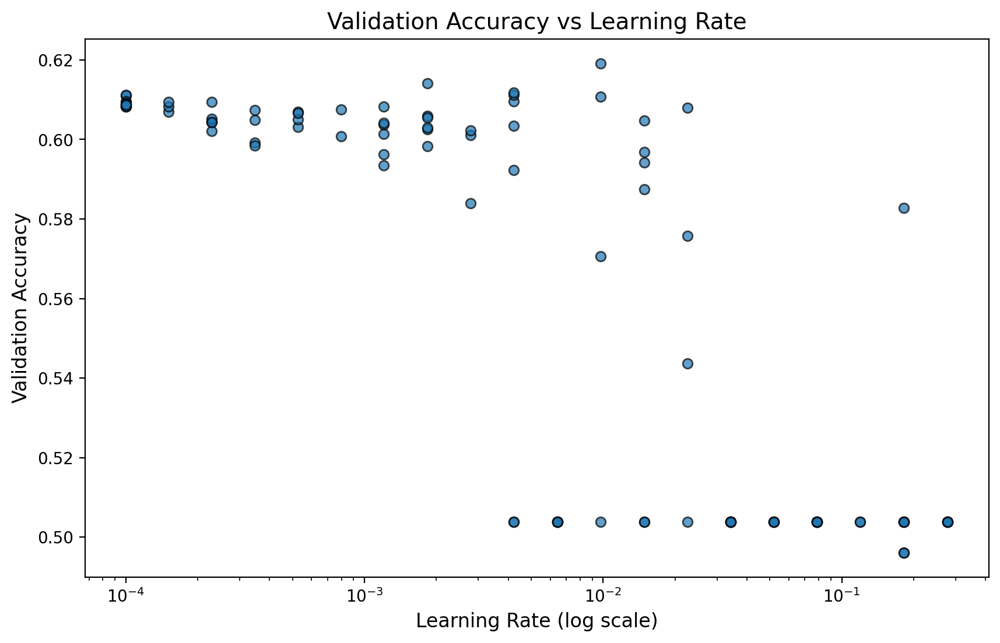

In [24]:
plt.figure(figsize=(10, 6))
plt.scatter(df_100_RNNs['lr'], df_100_RNNs['val_acc'], alpha=0.7, edgecolors='k')
plt.xscale('log')
plt.xlabel('Learning Rate (log scale)', fontsize=12)
plt.ylabel('Validation Accuracy', fontsize=12)
plt.title('Validation Accuracy vs Learning Rate', fontsize=14)
#plt.grid(True, which="both", linestyle='--', linewidth=0.5)
plt.show()